In [1]:
import sys
sys.path.append('/home/l_bechir/github/aare/build')

In [2]:
from _aare import *
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import mpld3
mpld3.enable_notebook()

In [3]:
import _aare
dir(_aare)

['Auto',
 'ChipTestBoard',
 'Cluster',
 'ClusterFileV2',
 'ClusterFinder',
 'ClusterHeader',
 'ClusterV2',
 'ClusterV2_',
 'DOUBLE',
 'DetectorType',
 'Dtype',
 'DtypeIndex',
 'ERROR',
 'Eiger',
 'FLOAT',
 'File',
 'FileConfig',
 'Frame',
 'INT16',
 'INT32',
 'INT64',
 'INT8',
 'Jungfrau',
 'Moench',
 'Mythen3',
 'NDArray_<i1_2',
 'NDArray_<i2_2',
 'NDArray_<i4_2',
 'NDArray_<i8_2',
 'NDArray_<u1_2',
 'NDArray_<u2_2',
 'NDArray_<u4_2',
 'NDArray_<u8_2',
 'NDArray_f4_2',
 'NDArray_f8_2',
 'NDView_<i1_2',
 'NDView_<i2_2',
 'NDView_<i4_2',
 'NDView_<i8_2',
 'NDView_<u1_2',
 'NDView_<u2_2',
 'NDView_<u4_2',
 'NDView_<u8_2',
 'NDView_f4_2',
 'NDView_f8_2',
 'Path',
 'Pedestal',
 'TimingMode',
 'Transforms',
 'Trigger',
 'UINT16',
 'UINT32',
 'UINT64',
 'UINT8',
 'Unknown',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'big',
 'endian',
 'little',
 'native',
 'sls_detector_header',
 'to_clustV2',
 'to_frame',
 'xy']

In [4]:
!pwd

/home/l_bechir/github/aare/src/python/example


In [5]:
file = File("../../../data/jungfrau/jungfrau_single_master_0.json")
file.rows,file.cols,file.bitdepth,file.detector_type

(512, 1024, 16, <DetectorType.Jungfrau: 0>)

In [6]:
frame = file.read()
frame.rows,frame.cols,frame.bitdepth

(512, 1024, 16)

In [7]:
np.array(frame)

array([[2123, 2852, 2821, ..., 3007, 3039, 2677],
       [2691, 3291, 3284, ..., 3246, 3189, 2960],
       [3062, 3222, 3080, ..., 3016, 3198, 2942],
       ...,
       [2679, 3041, 2709, ..., 3399, 3190, 3068],
       [2985, 3063, 2908, ..., 3211, 3231, 3137],
       [2326, 2480, 2893, ..., 2925, 3354, 3252]], dtype=uint16)

In [8]:
# plt.imshow(np.array(frame))
# plt.show()

In [9]:
file = File("/mnt/sls_det_storage/moench_data/testNewFW20230714/cu_half_speed_master_4.json")
file.rows,file.cols,file.detector_type

(400, 400, <DetectorType.Moench: 3>)

400


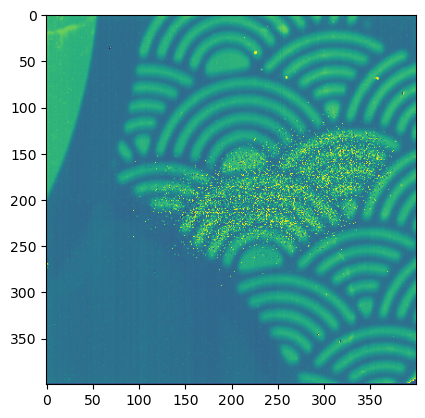

In [10]:
frame = file.read()
nparray = np.array(frame)
plt.imshow(nparray)
plt.show()

In [12]:
cluster_file = ClusterFileV2("/mnt/sls_det_storage/moench_data/testNewFW20230714/clust/cu_half_speed_d0_f0_4.clust",'r')
cluster_file.frame_number()

23389

In [13]:
cluster_file.frame_number()

23389

In [14]:
pedestal = Pedestal(file.rows,file.cols)

In [15]:
for i in range(1000):
    frame = file.iread(i)
    pedestal.push(frame)
    

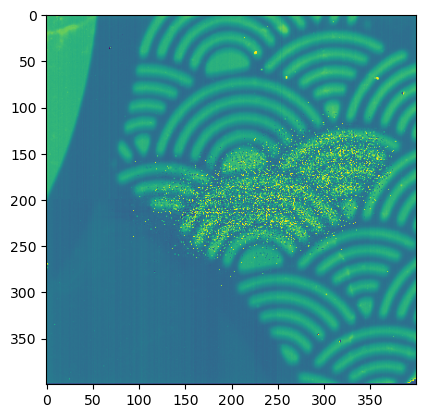

In [16]:
ndarray = pedestal.mean()
plt.imshow(np.array(ndarray))
plt.show()

In [17]:
pedestal.mean()[0,0], np.array(file.iread(0))[0,0]

(4407.045, 4488)

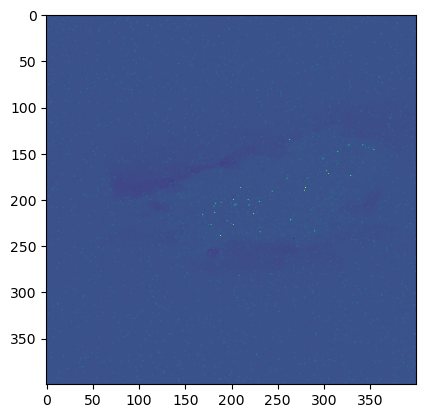

In [18]:
denoised_array = np.array(file.iread(0))-np.array(pedestal.mean())
plt.imshow(denoised_array)
plt.show()

In [19]:
#find frame with frame_number 23389
frame=None
for i in range(file.total_frames):
    fn = file.frame_number(i)
    if(fn==cluster_file.frame_number()):
        frame=file.iread(i)
        break
i,file.frame_number(i),np.array(frame)        
    


(1012,
 23389,
 array([[ 4421,  4267,  4534, ...,  4257,  4277,  4427],
        [11941, 11688, 11716, ...,  7054,  7370,  7448],
        [11738, 11381, 11393, ...,  6787,  7152,  7092],
        ...,
        [ 7265,  7007,  6977, ...,  4084,  4180,  4305],
        [ 7188,  7334,  6944, ...,  4084,  4346,  4266],
        [ 4157,  4290,  4343, ...,  4248,  4366,  4462]], dtype=uint16))

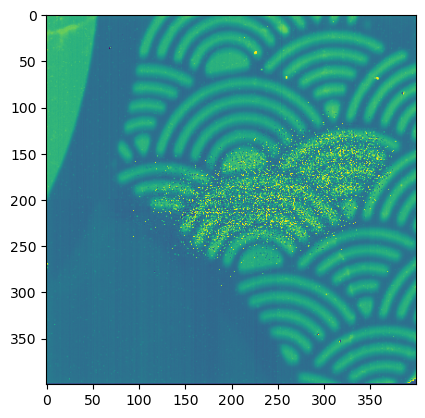

In [20]:
plt.imshow(np.array(frame))

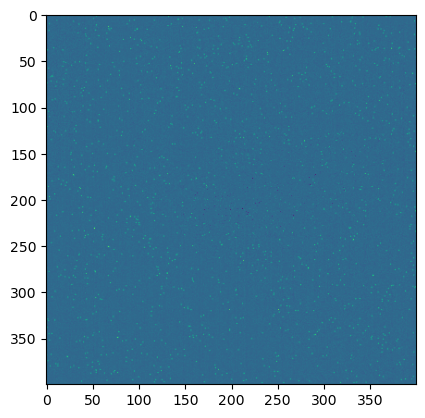

In [21]:
plt.imshow(np.array(frame)-pedestal.mean())

In [21]:
cluster_finder = ClusterFinder(3,3,5.0,0)
clusters = cluster_finder.find_clusters_without_threshold(np.array(frame),pedestal,True)
len(clusters)

1235

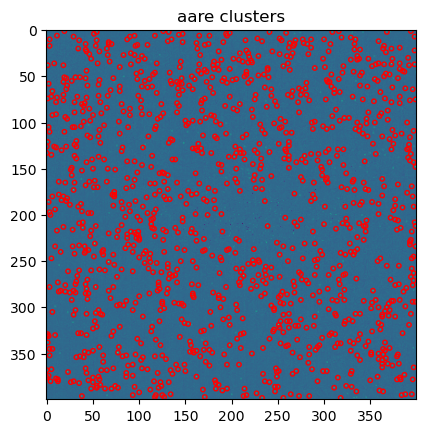

In [22]:
cluster_x = [cluster.x for cluster in clusters]
cluster_y = [cluster.y for cluster in clusters]
plt.imshow(np.array(frame)-pedestal.mean())
plt.scatter(cluster_x,cluster_y, s=10, facecolors='none', edgecolors='r')
plt.title("aare clusters")
plt.show()

In [23]:
cluster_file = ClusterFileV2("/mnt/sls_det_storage/moench_data/testNewFW20230714/clust/cu_half_speed_d0_f0_4.clust",'r')
print(cluster_file.frame_number())


23389


In [24]:
anna_clusters=cluster_file.read()
len(anna_clusters)

305

In [25]:
clusters[0]

<Cluster: x: 19, y: 1>

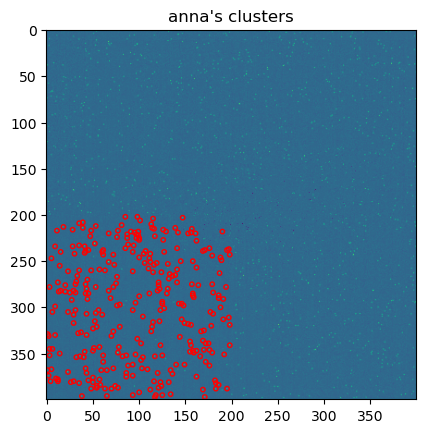

In [26]:
cluster_x = [cluster.cluster.x for cluster in anna_clusters]
cluster_y = [cluster.cluster.y for cluster in anna_clusters]

plt.imshow(np.array(frame)-pedestal.mean())
plt.scatter(cluster_x,cluster_y, s=10, facecolors='none', edgecolors='r')
plt.title("anna's clusters")
plt.show()

In [27]:
np.array(frame)

array([[ 4421,  4267,  4534, ...,  4257,  4277,  4427],
       [11941, 11688, 11716, ...,  7054,  7370,  7448],
       [11738, 11381, 11393, ...,  6787,  7152,  7092],
       ...,
       [ 7265,  7007,  6977, ...,  4084,  4180,  4305],
       [ 7188,  7334,  6944, ...,  4084,  4346,  4266],
       [ 4157,  4290,  4343, ...,  4248,  4366,  4462]], dtype=uint16)

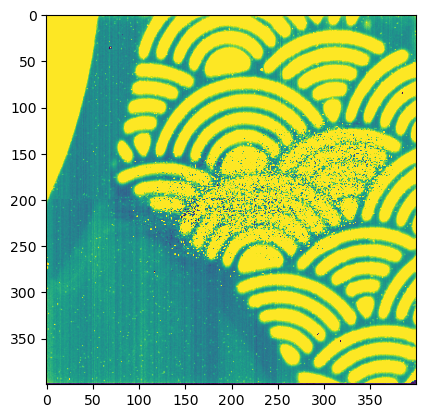

In [28]:
frame = file.iread(0)
plt.imshow(np.array(frame))
plt.clim(4000,8000)
plt.show()

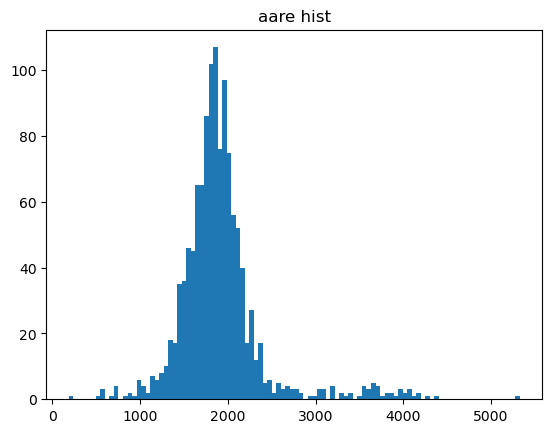

In [29]:
arr=[]
for c in clusters:
    # if c.x<=200 and c.y<200:
        arr.append(np.array(c,np.double).sum())
plt.hist(arr,bins=100)
plt.title("aare hist")
plt.show()

In [30]:
clusters[0]

<Cluster: x: 19, y: 1>

In [31]:
len(arr)

1235

In [32]:
anna_clusters[0].cluster

<ClusterV2_: x: 85, y: 202>

In [33]:
anna_clusters[0].cluster.data

[-27, 100, -12, 165, 1583, 133, 43, 181, 36]

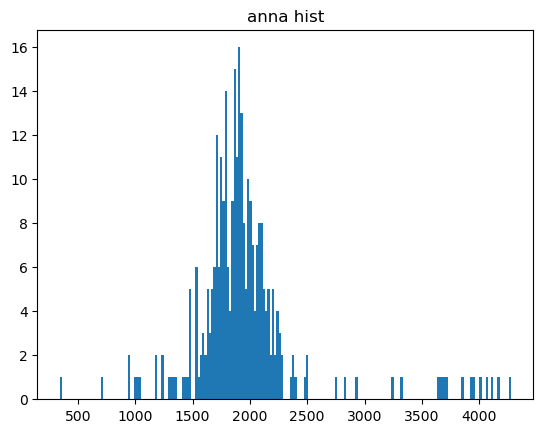

In [34]:
arr=[]
for c in anna_clusters:
    arr.append(np.array(c.cluster.data).sum())
plt.hist(arr,bins=200)
plt.title("anna hist")
plt.show()

# generate files for Anna

In [1]:
import sys
sys.path.append('/home/l_bechir/github/aare/build')
from _aare import *
import numpy as np
import matplotlib.pyplot as plt
import PIL
%matplotlib inline
import mpld3
mpld3.enable_notebook()

In [2]:
file = File("/home/l_bechir/tmp/testNewFW20230714/cu_half_speed_master_4.json")
file.rows,file.cols,file.detector_type

(400, 400, <DetectorType.Moench: 3>)

In [37]:
file.total_frames

500000

In [38]:
pedestal = Pedestal(file.rows,file.cols,1000)

In [39]:
np.array(pedestal.mean())

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [40]:
for i in range(10000):
    pedestal.push(file.iread(i))
    

In [41]:
np.array(pedestal.mean())

array([[ 4407.25189492,  4282.95110136,  4550.69097451, ...,
         4262.20985901,  4280.24933654,  4383.56048889],
       [11953.28110876, 11778.24694457, 11676.20752794, ...,
         6992.83460089,  7436.44641505,  7429.40658894],
       [11675.22950572, 11515.27522408, 11428.08638579, ...,
         6755.15369184,  7183.1975233 ,  7233.60160348],
       ...,
       [ 7159.45721368,  7134.77617143,  7027.17037646, ...,
         4126.79080658,  4171.74766572,  4287.98286878],
       [ 7301.95079689,  7290.27347149,  7154.93157717, ...,
         4087.96005992,  4376.77125286,  4283.70324464],
       [ 4172.96785356,  4316.48337111,  4332.48478962, ...,
         4217.20896468,  4303.20613058,  4438.38857135]])

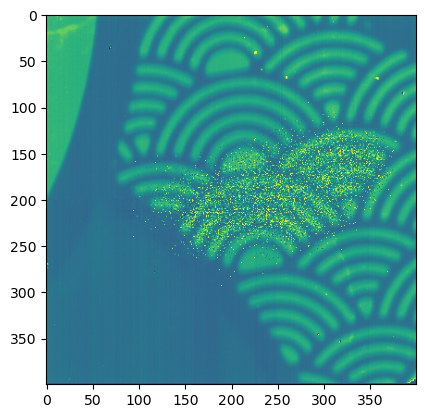

In [42]:
plt.imshow(np.array(pedestal.mean()))

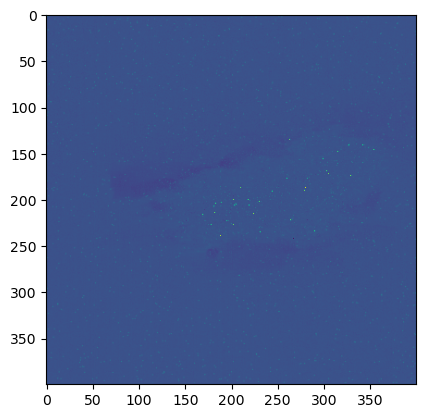

In [43]:
plt.imshow(file.iread(0)-np.array(pedestal.mean()))

In [44]:
pm = np.array(pedestal.mean()).copy()

In [45]:
cf = ClusterFinder(3,3,5.0,0)
frame = file.iread(0)
aare_clusters = cf.find_clusters_without_threshold(np.array(frame),pedestal,False)
len(aare_clusters)


1247

In [46]:
np.all(np.array(pm) == np.array(pedestal.mean())) # verify that pedestal changed

False

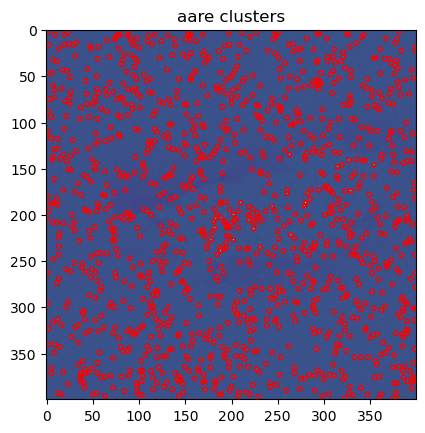

In [47]:
cluster_x = [cluster.x for cluster in aare_clusters]
cluster_y = [cluster.y for cluster in aare_clusters]
plt.imshow(np.array(frame)-pedestal.mean())
plt.scatter(cluster_x,cluster_y, s=10, facecolors='none', edgecolors='r')
plt.title("aare clusters")
plt.show()

In [48]:
np.array(aare_clusters[1],np.double)

array([ -60.28110876, -110.24694457,  -16.20752794,  -14.22950572,
       1646.72477592,  157.91361421,  -25.00535141,   30.29355772,
         -6.01255217])

In [49]:
frame = file.iread(0)


In [50]:
np.array(frame)[2,1]


13162

In [51]:
np.array(frame)[2,1]-np.array(pedestal.mean())[2,1]

1646.7247759246839

In [52]:
np.array(pedestal.mean())[2,1]

11515.275224075316

In [53]:
# mean of pedestal values

In [54]:
mean = np.zeros((400,400),np.longdouble)

In [55]:
for i in range(10000):
    frame=file.iread(i)
    mean+=frame
    

In [56]:
mean/10000

array([[ 4408.3748,  4283.1226,  4550.4812, ...,  4262.01  ,  4278.7303,
         4384.0441],
       [11944.3231, 11771.3067, 11674.3346, ...,  6985.8948,  7438.189 ,
         7430.4928],
       [11670.4296, 11515.3191, 11430.5895, ...,  6757.2411,  7187.0232,
         7232.5534],
       ...,
       [ 7155.6521,  7135.2982,  7027.8567, ...,  4126.3545,  4172.352 ,
         4288.1651],
       [ 7297.7784,  7286.5338,  7150.5882, ...,  4087.3384,  4377.1551,
         4283.8637],
       [ 4173.3327,  4317.7249,  4333.9394, ...,  4216.0182,  4302.7162,
         4437.9035]], dtype=float128)

In [57]:
frame = file.read()
a= np.array(frame)
a

array([[ 4488,  4318,  4553, ...,  4300,  4295,  4433],
       [11893, 11668, 11660, ...,  7010,  7452,  7424],
       [11661, 13162, 11586, ...,  6698,  7205,  7242],
       ...,
       [ 7211,  7190,  7047, ...,  4221,  4242,  4286],
       [ 7168,  7281,  7168, ...,  4114,  4466,  4271],
       [ 4192,  4308,  4325, ...,  4185,  4350,  4512]], dtype=uint16)

In [58]:
a.mean()

7720.9082375

In [59]:
p=Pedestal(400,400,1000)
for i in range(10000):
    p.push(file.iread(i))

In [60]:
np.array(p.mean())

array([[ 4407.25189492,  4282.95110136,  4550.69097451, ...,
         4262.20985901,  4280.24933654,  4383.56048889],
       [11953.28110876, 11778.24694457, 11676.20752794, ...,
         6992.83460089,  7436.44641505,  7429.40658894],
       [11675.22950572, 11515.27522408, 11428.08638579, ...,
         6755.15369184,  7183.1975233 ,  7233.60160348],
       ...,
       [ 7159.45721368,  7134.77617143,  7027.17037646, ...,
         4126.79080658,  4171.74766572,  4287.98286878],
       [ 7301.95079689,  7290.27347149,  7154.93157717, ...,
         4087.96005992,  4376.77125286,  4283.70324464],
       [ 4172.96785356,  4316.48337111,  4332.48478962, ...,
         4217.20896468,  4303.20613058,  4438.38857135]])

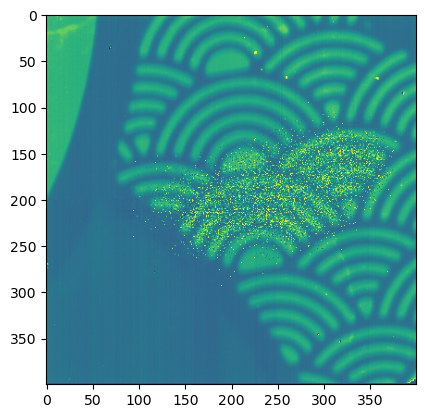

In [61]:
plt.imshow(np.array(p.mean()))

In [62]:
anna_ped = np.array(PIL.Image.open("/mnt/sls_det_storage/moench_data/testNewFW20230714/clustNew/cu_half_speed_d0_f0_4_ped.tiff"),np.float32)
anna_ped = np.flip(anna_ped,axis=0)
anna_ped

array([[ 4408.14  ,  4283.1533,  4550.542 , ...,  4261.9365,  4278.975 ,
         4383.991 ],
       [11946.262 , 11773.706 , 11674.875 , ...,  6986.732 ,  7437.579 ,
         7430.647 ],
       [11672.11  , 11515.876 , 11430.544 , ...,  6757.2144,  7186.2446,
         7232.9033],
       ...,
       [ 7156.373 ,  7135.3525,  7027.8877, ...,  4126.469 ,  4172.2397,
         4288.0996],
       [ 7299.0845,  7287.2896,  7151.781 , ...,  4087.4556,  4377.1353,
         4283.8457],
       [ 4173.1865,  4317.468 ,  4333.666 , ...,  4216.2686,  4302.7876,
         4437.914 ]], dtype=float32)

In [63]:
aare_ped =np.array(p.mean())
anna_ped[20,20] ,aare_ped[20,20]

(12294.483, 12298.808639201068)

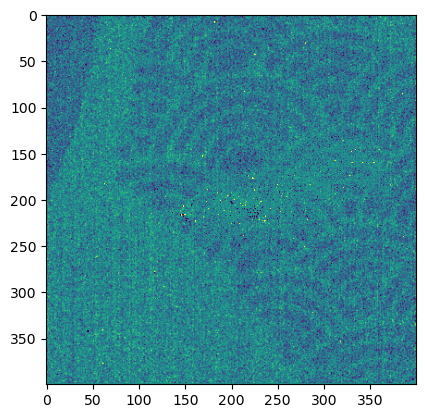

In [64]:
plt.imshow(anna_ped-aare_ped)
plt.clim(-10,10)

In [65]:
diff = anna_ped-aare_ped
diff.max(),diff.min(),diff.mean()

(138.0528710409144, -182.5636241522716, -1.419821648504415)

In [66]:
len(np.where(diff>5)[0])

758

In [67]:
arr=[]
for i in range(10000):
    frame = file.iread(i)
    arr.append(np.array(frame,copy=False)[20,20])
len(arr)

10000

/home/l_bechir/miniforge3/envs/aare/lib/python3.12/site-packages/numpy/lib/polynomial.py:667: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
/home/l_bechir/miniforge3/envs/aare/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/tmp/ipykernel_1536660/1470900620.py:1: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(range(10000), arr, 50)


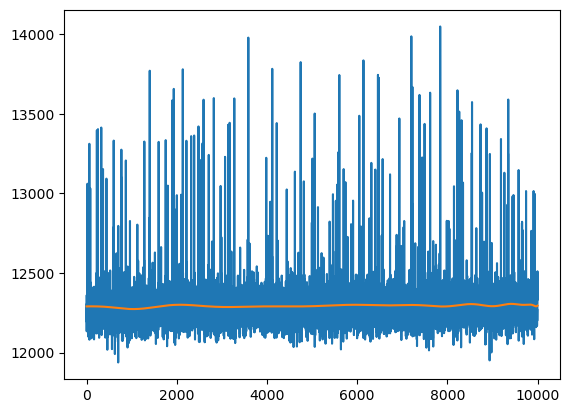

In [68]:
z = np.polyfit(range(10000), arr, 50)
poly = np.poly1d(z)

plt.plot(range(10000),arr)
plt.plot(range(10000),[poly(x) for x in range(10000)])
plt.show()

In [2]:
# generate cluster file
import time
from tqdm import tqdm
from tqdm import trange

In [73]:
file = File("/home/l_bechir/tmp/testNewFW20230714/cu_half_speed_master_4.json")
p=Pedestal(400,400,1000)
for i in range(10000):
    frame = file.iread(i)
    p.push(frame)
np.array(p.mean())

array([[ 4407.25189492,  4282.95110136,  4550.69097451, ...,
         4262.20985901,  4280.24933654,  4383.56048889],
       [11953.28110876, 11778.24694457, 11676.20752794, ...,
         6992.83460089,  7436.44641505,  7429.40658894],
       [11675.22950572, 11515.27522408, 11428.08638579, ...,
         6755.15369184,  7183.1975233 ,  7233.60160348],
       ...,
       [ 7159.45721368,  7134.77617143,  7027.17037646, ...,
         4126.79080658,  4171.74766572,  4287.98286878],
       [ 7301.95079689,  7290.27347149,  7154.93157717, ...,
         4087.96005992,  4376.77125286,  4283.70324464],
       [ 4172.96785356,  4316.48337111,  4332.48478962, ...,
         4217.20896468,  4303.20613058,  4438.38857135]])

In [4]:
np.array(p.mean())

array([[ 4407.25189492,  4282.95110136,  4550.69097451, ...,
         4262.20985901,  4280.24933654,  4383.56048889],
       [11953.28110876, 11778.24694457, 11676.20752794, ...,
         6992.83460089,  7436.44641505,  7429.40658894],
       [11675.22950572, 11515.27522408, 11428.08638579, ...,
         6755.15369184,  7183.1975233 ,  7233.60160348],
       ...,
       [ 7159.45721368,  7134.77617143,  7027.17037646, ...,
         4126.79080658,  4171.74766572,  4287.98286878],
       [ 7301.95079689,  7290.27347149,  7154.93157717, ...,
         4087.96005992,  4376.77125286,  4283.70324464],
       [ 4172.96785356,  4316.48337111,  4332.48478962, ...,
         4217.20896468,  4303.20613058,  4438.38857135]])

In [5]:
cf = ClusterFinder(3,3,5.0,0)
arr={}
start = time.time()
for i in trange(10000):
    frame = file.iread(i)
    clusters = cf.find_clusters_without_threshold(np.array(frame,copy=False),p,False)
    if file.frame_number(i) in arr:
        print(file.frame_number(i),"already exists")
    arr[file.frame_number(i)] = clusters
    
print(time.time()-start)
    
    
    

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [10:56<00:00, 15.22it/s]

656.9906969070435


In [6]:
cfc = arr[22377]

In [7]:
wc = to_clustV2(arr[22377],22377)

In [9]:
print(wc[1000])
print(cfc[1000])

<ClusterV2: frame_number: 22377, x: 288, y: 323>
<Cluster: x: 288, y: 323>


In [17]:
c_file = ClusterFileV2("/home/l_bechir/tmp/TEST1.clust","w")
i=0
for frame_number,clusters in arr.items():
    c_file.write(to_clustV2(clusters,frame_number))
    print(i,end="\r")
    i+=1
    

In [38]:
c_file = ClusterFileV2("/home/l_bechir/tmp/TEST1.clust","r")
b=(c_file.read(10000))

In [44]:
for clusters in b:
    if clusters[0].frame_number == 32373:
        print(clusters[0])
        print(np.array(clusters[0].cluster.data))
        break
    
    

<ClusterV2: frame_number: 32373, x: 103, y: 1>
[ 10  -7  51  14 489 111  41   2 -80]


In [25]:
s=0
for i,c in arr.items():
    s+=len(c)
s

13771143

In [27]:
s*(2+2+9*4) + len(arr)*(4+4)

550925720

In [28]:
550925720/1024/1024

525.4037094116211

In [57]:
c_file = ClusterFileV2("/mnt/sls_det_storage/moench_data/testNewFW20230714/clustNew/cu_half_speed_d0_f0_4.clust","r")
x=(c_file.read(10000))

In [46]:
np.array(x[-1][0].cluster.data)

array([  0,   0,   0,   9, 486, 104,  36,   0, -84])

In [68]:
sum_arr = []
for clusters in tqdm(b):
    for cluster in clusters:
        sum_arr.append(np.array(cluster.cluster.data).sum())
len(sum_arr)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:23<00:00, 120.41it/s]


13771143

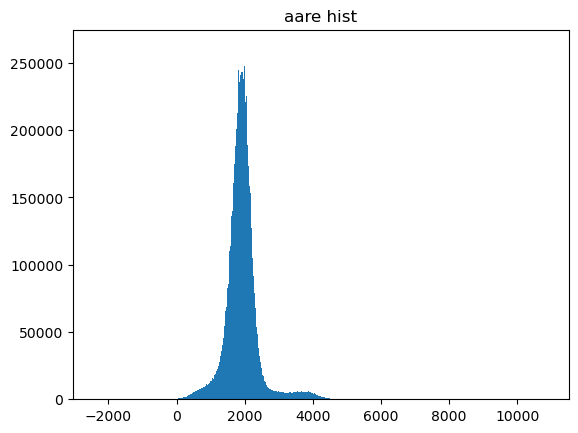

In [69]:
plt.hist(sum_arr,bins=1000)
plt.title("aare hist")
plt.show()

In [66]:
anna_sum_arr = []
for clusters in tqdm(x):
    for cluster in clusters:
        anna_sum_arr.append(np.array(cluster.cluster.data).sum())
len(anna_sum_arr)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:18<00:00, 126.93it/s]


13548170

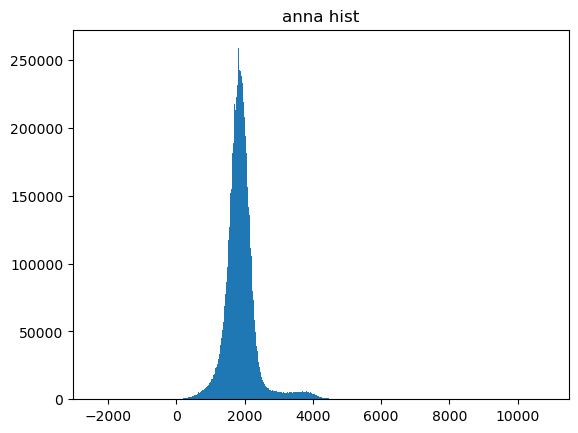

In [70]:
plt.hist(anna_sum_arr,bins=1000)
plt.title("anna hist")
plt.show()

In [71]:
print("aare: min",np.min(sum_arr), "max", np.max(sum_arr), "mean", np.mean(sum_arr))

aare: min -2379 max 10860 mean 1922.0537678680703


In [1]:
print("anna: min",np.min(anna_sum_arr), "max", np.max(anna_sum_arr), "mean", np.mean(anna_sum_arr))

NameError: name 'np' is not defined

In [80]:
np.save("/home/l_bechir/tmp/pedestal_stdev_double",np.array(p.standard_deviation()))

In [88]:
count =0
for fn, clusters in arr.items():
    for cluster in clusters:
        hist.fill(cluster.x,cluster.y, np.array(cluster).sum())
    print(count,end="\r")
    count+=1
    


In [90]:
hist.view().shape

(400, 400, 100)

In [117]:
hist.axes.edges[0]

array([[[  0.]],

       [[  1.]],

       [[  2.]],

       [[  3.]],

       [[  4.]],

       [[  5.]],

       [[  6.]],

       [[  7.]],

       [[  8.]],

       [[  9.]],

       [[ 10.]],

       [[ 11.]],

       [[ 12.]],

       [[ 13.]],

       [[ 14.]],

       [[ 15.]],

       [[ 16.]],

       [[ 17.]],

       [[ 18.]],

       [[ 19.]],

       [[ 20.]],

       [[ 21.]],

       [[ 22.]],

       [[ 23.]],

       [[ 24.]],

       [[ 25.]],

       [[ 26.]],

       [[ 27.]],

       [[ 28.]],

       [[ 29.]],

       [[ 30.]],

       [[ 31.]],

       [[ 32.]],

       [[ 33.]],

       [[ 34.]],

       [[ 35.]],

       [[ 36.]],

       [[ 37.]],

       [[ 38.]],

       [[ 39.]],

       [[ 40.]],

       [[ 41.]],

       [[ 42.]],

       [[ 43.]],

       [[ 44.]],

       [[ 45.]],

       [[ 46.]],

       [[ 47.]],

       [[ 48.]],

       [[ 49.]],

       [[ 50.]],

       [[ 51.]],

       [[ 52.]],

       [[ 53.]],

       [[ 54.]],

       [[ 

In [131]:

# fig, ax = plt.subplots()
# mesh = ax.pcolormesh(list(range(0,401)),list(range(401))[::-1], hist.view().sum(axis=2).T)
# fig.colorbar(mesh)
# plt.title("sum of clusters per pixel")
# plt.savefig("cluster_sum_per_pixel.png")